In [1]:
from utlities.cal_utils import Format, Analyze

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker  # Import ticker module

import seaborn as sns
import math
import scipy

import numpy as np


import os

rep = "3"
path_data = f"./Data/rep{rep}_data.xlsx"
path_md = f"./picker_suggestions_modified/rep{rep}_edited.xlsx"


folder = f"./rep{rep}_data_analysis"

form = Format(path = path_data)
analyze = Analyze()

sns.set_style("darkgrid")
sns.color_palette('colorblind')

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [2]:
if not os.path.exists(folder):

    # if the demo_folder directory is not present
    # then create it.
    os.makedirs(folder)

In [3]:
if not os.path.exists(f'./picker_outputs_rep{rep}/Rep{rep}_df.csv'):

    df = form.tidy_file(delta = False, average = True)
    df.to_csv(f'./picker_outputs_rep{rep}/Rep{rep}_df.csv', index=False)

In [4]:
#load the first exel file in tidy format
df = pd.read_csv(f'./picker_outputs_rep{rep}/Rep{rep}_df.csv')


#the start times selected by chelsea and the end times selected by me
md = pd.read_excel(path_md)


In [5]:
df

,Time (sec),[hr]:[min]:[sec],A.U.,Normalized A.U.,Cell #,Treatment
0,1.295,00:00:01.295000,1.889000,1.000000,Cell 1,NoRTG NoInh - Islet 1
1,2.590,00:00:02.590000,2.333000,1.235045,Cell 1,NoRTG NoInh - Islet 1
2,3.885,00:00:04,2.222000,1.176284,Cell 1,NoRTG NoInh - Islet 1
3,5.180,00:00:05.180000,2.222000,1.176284,Cell 1,NoRTG NoInh - Islet 1
4,6.475,00:00:06.475000,2.333000,1.235045,Cell 1,NoRTG NoInh - Islet 1
...,...,...,...,...,...,...
455420,2517.480,00:41:57.480000,3.331500,0.538120,AVG,10wt% RTG NoInh - Islet 2
455421,2518.775,00:41:58.775000,3.166625,0.511488,AVG,10wt% RTG NoInh - Islet 2
455422,2520.070,00:42:00.070000,3.267250,0.527742,AVG,10wt% RTG NoInh - Islet 2
455423,2521.365,00:42:01.365000,3.199500,0.516799,AVG,10wt% RTG NoInh - Islet 2


In [6]:
examp = md[md["Represent"] == True]
examp

,Unnamed: 0,Treatment,11 mM Stimulus,End 11 mM 2nd Phase,20 mM Stimulus,KCL Stimulus,Example Cells,11 mM End,End Option 1,End Option 2,End Option 3,Represent,Quality,Notes
28,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 6,900.000,883.190,1032.115,1411.550,True,1,custom
29,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 7,916.860,916.860,1019.165,1243.200,True,1,custom
30,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 8,955.710,481.740,955.710,1275.575,True,2,small pre-peak
32,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 10,967.365,967.365,1462.055,NaN,True,1,NaN
33,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 11,999.740,464.905,999.740,1256.150,True,2,small pre-peak
40,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,AVG,1000.000,488.215,1021.755,1253.560,True,2,"custom, small pre-peak"
49,2,2.5wt% RTG NoInh - Islet 1,1440,NaN,2400,2940,Cell 9,1910.000,1884.225,2048.690,2249.415,True,1,custom
53,2,2.5wt% RTG NoInh - Islet 1,1440,NaN,2400,2940,Cell 13,1925.000,1912.715,2074.590,2249.415,True,1,custom
55,2,2.5wt% RTG NoInh - Islet 1,1440,NaN,2400,2940,Cell 15,1850.000,1723.645,2086.245,2293.445,True,1,custom
56,2,2.5wt% RTG NoInh - Islet 1,1440,NaN,2400,2940,Cell 16,1930.000,1898.470,2222.220,NaN,True,1,NaN


In [7]:
new_dfs = []

for treat in examp.Treatment.unique():
    temp_md = examp[examp.Treatment == treat]
    temp_df = df[df.Treatment == treat]

    cells = temp_md["Example Cells"].unique()
    print(cells)

    temp_df = temp_df[temp_df["Cell #"].isin(cells)]
    new_dfs.append(temp_df)

df = pd.concat(new_dfs)

['Cell 6' 'Cell 7' 'Cell 8' 'Cell 10' 'Cell 11' 'AVG']
['Cell 9' 'Cell 13' 'Cell 15' 'Cell 16' 'Cell 17' 'AVG']
['Cell 2' 'Cell 3' 'Cell 4' 'Cell 5' 'Cell 24' 'AVG']
['Cell 4' 'Cell 5' 'Cell 7' 'Cell 16' 'Cell 20' 'AVG']


In [8]:
df[df["Treatment"]==treat]["Cell #"].unique()

array(['Cell 4', 'Cell 5', 'Cell 7', 'Cell 16', 'Cell 20', 'AVG'],
      dtype=object)

In [9]:
for treat in list(df.Treatment.unique()):
    print(treat)
    print(len(df[df.Treatment == treat]["Cell #"].unique()))

NoRTG NoInh - Islet 2
6
2.5wt% RTG NoInh - Islet 1
6
5wt% RTG NoInh - Islet 1
6
10wt% RTG NoInh - Islet 1
6


In [10]:
from math import log10, floor
def round_sig(x, sig=1, small_value=1.0e-9):
    rounded = round(x, sig - int(floor(log10(max(abs(x), abs(small_value))))) - 1)

    return rounded

In [11]:
md

,Unnamed: 0,Treatment,11 mM Stimulus,End 11 mM 2nd Phase,20 mM Stimulus,KCL Stimulus,Example Cells,11 mM End,End Option 1,End Option 2,End Option 3,Represent,Quality,Notes
0,0,NoRTG NoInh - Islet 1,240,NaN,1860,2940,Cell 1,955.710,372.960,955.710,1118.880,False,2,or 372?? Small pre-peak
1,0,NoRTG NoInh - Islet 1,240,NaN,1860,2940,Cell 2,542.605,542.605,907.795,1188.810,False,1,
2,0,NoRTG NoInh - Islet 1,240,NaN,1860,2940,Cell 3,1010.000,371.665,488.215,641.025,False,2,custom
3,0,NoRTG NoInh - Islet 1,240,NaN,1860,2940,Cell 4,694.120,694.120,1087.800,1441.335,False,1,NaN
4,0,NoRTG NoInh - Islet 1,240,NaN,1860,2940,Cell 5,1047.655,449.365,1047.655,1367.520,False,2,"custom, prepeak"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186,9,10wt% RTG NoInh - Islet 2,240,NaN,1380,2340,Cell 6,521.885,521.885,641.025,769.230,False,1,NaN
187,9,10wt% RTG NoInh - Islet 2,240,NaN,1380,2340,Cell 7,653.975,653.975,797.720,973.840,False,1,NaN
188,9,10wt% RTG NoInh - Islet 2,240,NaN,1380,2340,Cell 8,695.415,251.230,695.415,799.015,False,1,NaN
189,9,10wt% RTG NoInh - Islet 2,240,NaN,1380,2340,Cell Avg,534.835,534.835,661.745,802.900,False,2,NaN


In [12]:
if not os.path.exists(f'{folder}/Seperations'): 
      
     # if the demo_folder directory is not present then create it
                        
    os.makedirs(f'{folder}/Seperations')

NoRTG NoInh - Islet 2
['Cell 6' 'Cell 7' 'Cell 8' 'Cell 10' 'Cell 11' 'AVG']
2.5wt% RTG NoInh - Islet 1
['Cell 9' 'Cell 13' 'Cell 15' 'Cell 16' 'Cell 17' 'AVG']
5wt% RTG NoInh - Islet 1
['Cell 2' 'Cell 3' 'Cell 4' 'Cell 5' 'Cell 24' 'AVG']
10wt% RTG NoInh - Islet 1
['Cell 4' 'Cell 5' 'Cell 7' 'Cell 16' 'Cell 20' 'AVG']


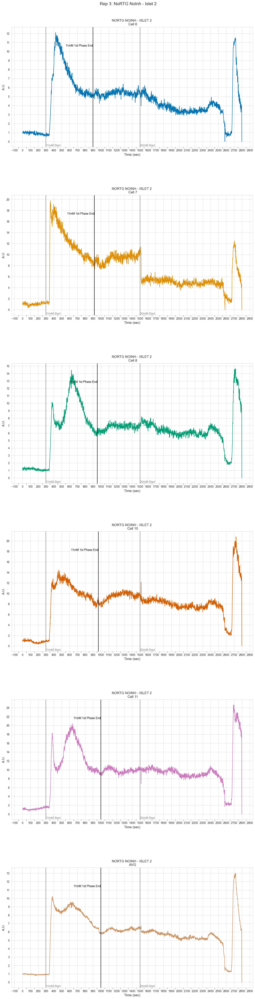

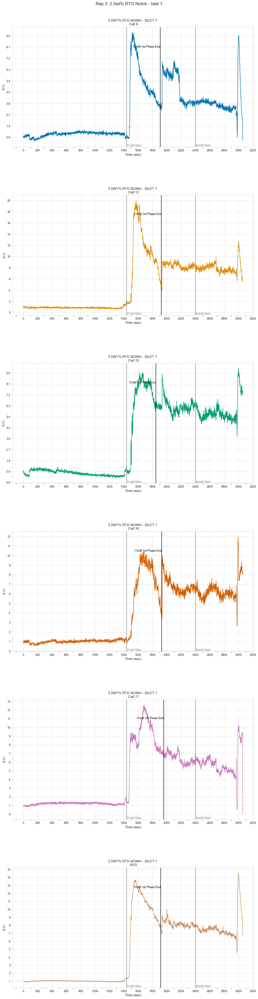

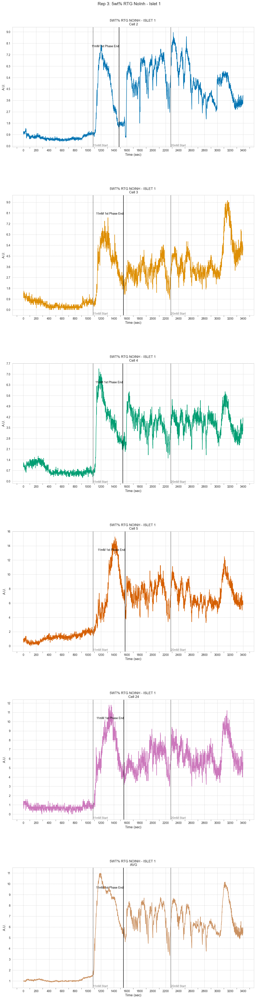

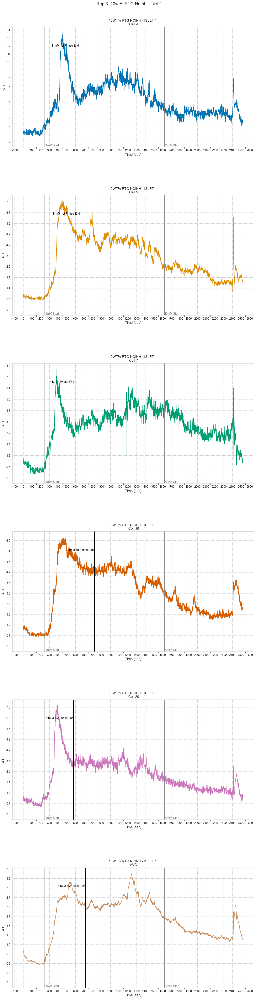

In [13]:
treatments = df.Treatment.unique()
sns.set_style("whitegrid", {'grid.linestyle': '--'})

# loop through the length of tickers and keep track of index
for n, treat in enumerate(treatments):

    temp_df = df[df["Treatment"] == treat]
    temp_md = md[md["Treatment"] == treat]

    cells = temp_df["Cell #"].unique()

    #re-iniitialize the color pallet with each new set of plots:
    palette = sns.color_palette("colorblind", len(cells))

    #initialize plot
    plt.figure(figsize=(15, int(10*len(cells))))
    plt.subplots_adjust(hspace=0.4)
    plt.suptitle(f"Rep {rep}: {treat}", fontsize=15, y=0.9)
    print(treat)
    print(cells)
    for m, cell in enumerate(cells):

        cell_md = temp_md[temp_md["Example Cells"] == cell]
        plot_df = temp_df[temp_df["Cell #"] == cell]

        col_num = 1
        ax = plt.subplot(int(math.ceil(len(cells)/col_num)), col_num, m + 1)



        ax.set_xlabel("Time (sec)")
        ax.set_ylabel("A.U.")
        #ax.legend()
        #ax.get_legend().remove()
        #ax.set_xlabel("")

        sns.lineplot(data = plot_df,x = "Time (sec)", y = "Normalized A.U.", color=palette[m])
        # Set more frequent ticks on the x-axis

                    #if there is no metadata
        if len(temp_md) == 0:
            print(f"There is no metadata on {treat} so no starts or ends of curves are unknown")
            continue

        #if we have metadata on the cell
        else:
            # filter df and plot ticker on the new subplot axis
            ax.axvline(x=cell_md["11 mM Stimulus"].iloc[0], color='grey')
            ax.axvline(x=cell_md["11 mM End"].iloc[0], color='black')
            ax.axvline(x=cell_md["20 mM Stimulus"].iloc[0], color='grey')

            # Text labels
            y_pos = ax.get_ylim()[0]  # Position at the bottom of the graph
            ax.text(cell_md["11 mM Stimulus"].iloc[0], y_pos, "11mM Start", color='grey', verticalalignment='bottom')
            ax.text(cell_md["11 mM End"].iloc[0], ax.get_ylim()[1]*.85 , "11mM 1st Phase End", color='black', verticalalignment='top', horizontalalignment='right')
            ax.text(cell_md["20 mM Stimulus"].iloc[0], y_pos, "20mM Start", color='grey', verticalalignment='bottom')

            if pd.notna(cell_md["End 11 mM 2nd Phase"].iloc[0]):
                ax.axvline(x=cell_md["End 11 mM 2nd Phase"].iloc[0], color='black')
                ax.text(cell_md["End 11 mM 2nd Phase"].iloc[0], ax.get_ylim()[1]*1 , "11mM 2nd Phase End", color='black', verticalalignment='top', horizontalalignment='left')


        xspacing = int(round_sig((plot_df["Time (sec)"].max() - plot_df["Time (sec)"].min())/20))
        ax.xaxis.set_major_locator(ticker.MultipleLocator(xspacing))  # Adjust the locator value as needed
        yspacing = round_sig((plot_df["Normalized A.U."].max()/10))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(yspacing))
        ax.tick_params(axis='x', labelsize=10)  # Adjust the font size of x-axis tick labels
        ax.tick_params(axis='y', labelsize=10)  # Adjust the font size of x-axis tick labels

        # Enable and enlarge minor ticks for visibility
        ax.minorticks_on()
        # Add minor ticks on the x-axis
        ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))  # Adds 1 minor tick between major ticks
        ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=5)


        ax.set_xlabel("Time (sec)", fontsize=12)
        ax.set_ylabel("A.U.", fontsize=12)
        # chart formatting
        ax.set_title(f"{treat.upper()} \n {cell}")


    plt.savefig(f"{folder}/Seperations/Rep{rep}_{treat}_sep.png", bbox_inches = "tight");






In [14]:
if not os.path.exists(f"{folder}/second_phase"):

    # if the demo_folder directory is not present
    # then create it.

    os.makedirs(f"{folder}/second_phase")

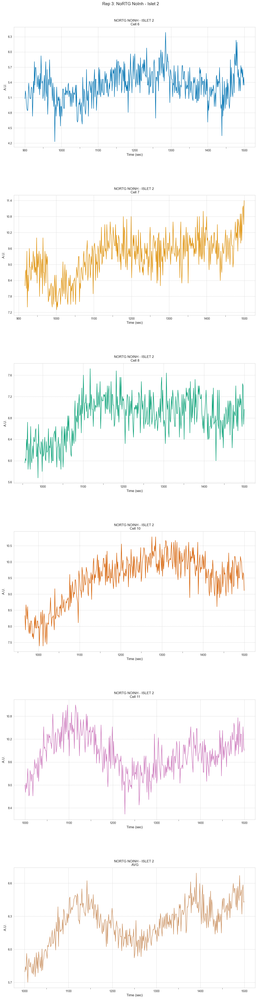

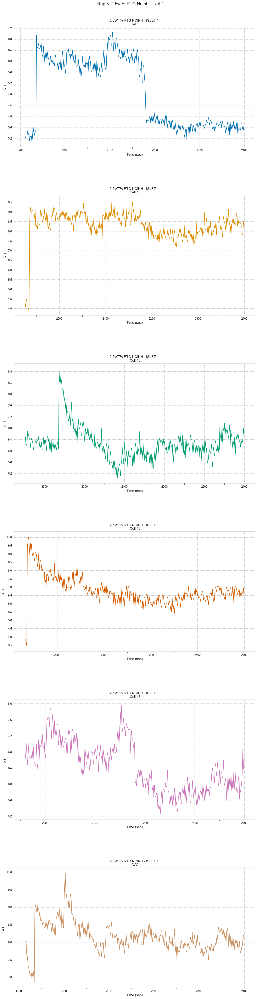

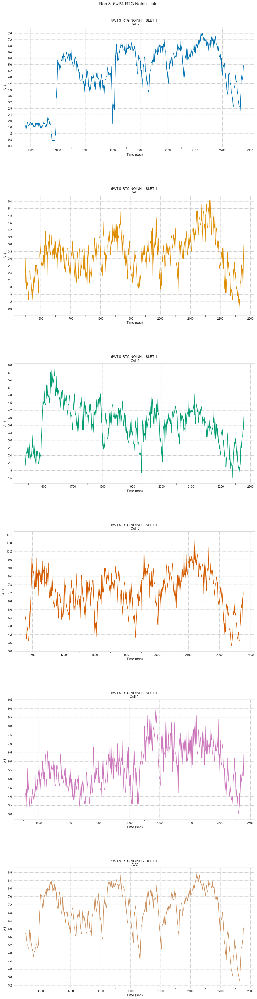

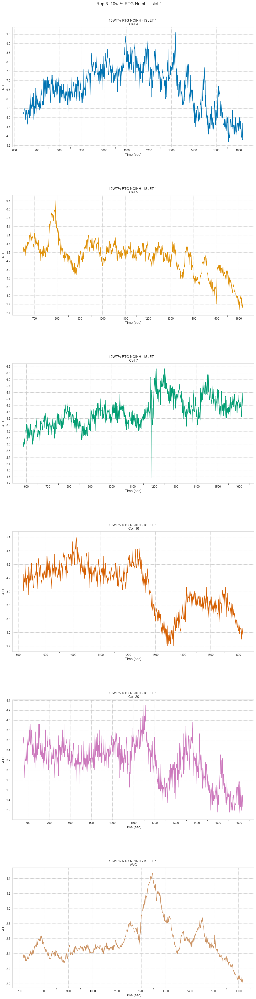

In [15]:
treatments = df.Treatment.unique()
sns.set_style("whitegrid", {'grid.linestyle': '--'})

# loop through the length of tickers and keep track of index
for n, treat in enumerate(treatments):

    temp_df = df[df["Treatment"] == treat]
    temp_md = md[md["Treatment"] == treat]

    cells = temp_df["Cell #"].unique()

    #re-iniitialize the color pallet with each new set of plots:
    palette = sns.color_palette("colorblind", len(cells))

    #initialize plot
    plt.figure(figsize=(15, int(10*len(cells))))
    plt.subplots_adjust(hspace=0.4)
    plt.suptitle(f"Rep {rep}: {treat}", fontsize=15, y=0.9)

    for m, cell in enumerate(cells):



        cell_md = temp_md[temp_md["Example Cells"] == cell]

        wind_start = cell_md["11 mM End"].iloc[0]

        wind_end = cell_md["20 mM Stimulus"].iloc[0]


        plot_df = temp_df[temp_df["Cell #"] == cell]
        plot_df = plot_df[plot_df["Time (sec)"].between(wind_start, wind_end)]

        col_num = 1
        ax = plt.subplot(int(math.ceil(len(cells)/col_num)), col_num, m + 1)



        # filter df and plot ticker on the new subplot axis

        ax.set_xlabel("Time (sec)")
        ax.set_ylabel("A.U.")
        #ax.legend()
        #ax.get_legend().remove()
        #ax.set_xlabel("")

        sns.lineplot(data = plot_df,x = "Time (sec)", y = "Normalized A.U.", color=palette[m])
        # Set more frequent ticks on the x-axis

        ax.xaxis.set_major_locator(ticker.MultipleLocator(100))  # Adjust the locator value as needed

        yspacing = round_sig((plot_df["Normalized A.U."].max()/20))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(yspacing))
        ax.tick_params(axis='x', labelsize=10)  # Adjust the font size of x-axis tick labels
        ax.tick_params(axis='y', labelsize=10)  # Adjust the font size of x-axis tick labels

        # Enable and enlarge minor ticks for visibility
        ax.minorticks_on()
        # Add minor ticks on the x-axis
        ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))  # Adds 1 minor tick between major ticks
        ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=5)

        ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))  # Adds 1 minor tick between major ticks
        #ax.tick_params(axis='y', which='minor', bottom=True, top=False, length=5)


        ax.set_xlabel("Time (sec)", fontsize=12)
        ax.set_ylabel("A.U.", fontsize=12)
        # chart formatting
        ax.set_title(f"{treat.upper()} \n {cell}")



    plt.savefig(f"{folder}/second_phase/Rep{rep}_{treat}_sep.png", bbox_inches = "tight");






In [16]:
def smooth(x_vals, window = 5, loops = 5):

    new = np.zeros(len(x_vals))

    for j in range(loops):
        for i in range(len(x_vals)):

            start_window = i - window
            end_window = i + window +1

            if start_window < 0:
                start_window = 0


            new[i] = np.average(x_vals[start_window: end_window])

        x_vals = new

    return x_vals

In [17]:
def find_troffs(time, smoothed_signal):
    """
    Function to find the start indices of peaks (troffs) and inflection points in the given signal.

    Parameters:
    - time: Array of time values.
    - smoothed_signal: Array of smoothed signal values.

    Returns:
    - peak_starts: Indices where peaks start.
    - trough_starts: Indices where troughs start.
    - inflection_points: Indices of inflection points.
    """

    # Calculate the first derivative of the smoothed signal
    derivative = np.diff(smoothed_signal) / np.diff(time)
    derivative = np.concatenate([[0], derivative])  # Adding a zero to align with the length of the signal

    # Identify where the derivative changes sign for peaks and troughs
    peak_start_indices = np.where(np.diff(np.signbit(derivative)))[0]

    # Filter out the peak starts that are actually trough beginnings
    peaks = peak_start_indices[derivative[peak_start_indices] < 0]

    # Filter out the trough starts that are actually peak beginnings
    troughs = peak_start_indices[derivative[peak_start_indices] > 0]

    # Calculate the second derivative for finding inflection points
    # We reduce the size of the time array to match the length of the first derivative before calculating the second derivative
    second_derivative = np.diff(derivative) / np.diff(time)
    second_derivative = np.concatenate([[0, 0], second_derivative])  # Adding zeros to align with the length of the signal

    # Find where the second derivative changes sign (inflection points)
    inflection_points = np.where(np.diff(np.signbit(second_derivative)))[0]

    # Filter out the peak starts that are actually trough beginnings
    peak_starts = inflection_points[derivative[inflection_points] < 0]

    # Filter out the trough starts that are actually peak beginnings
    peak_ends = inflection_points[derivative[inflection_points] > 0]

    return peaks, troughs, peak_starts, peak_ends


In [18]:
def find_troffs(time, smoothed_signal):
    """
    Function to find the start indices of peaks (troffs) and inflection points in the given signal.

    Parameters:
    - time: Array of time values.
    - smoothed_signal: Array of smoothed signal values.

    Returns:
    - peak_starts: Indices where peaks start.
    - trough_starts: Indices where troughs start.
    - inflection_points: Indices of inflection points.
    """

    # Calculate the first derivative of the smoothed signal
    derivative = np.diff(smoothed_signal) / np.diff(time)
    derivative = np.concatenate([[0], derivative])  # Adding a zero to align with the length of the signal

    # Identify where the derivative changes sign for peaks and troughs
    peak_start_indices = np.where(np.diff(np.signbit(derivative)))[0]

    # Filter out the peak starts that are actually trough beginnings
    peaks = peak_start_indices[derivative[peak_start_indices] < 0]

    # Filter out the trough starts that are actually peak beginnings
    troughs = peak_start_indices[derivative[peak_start_indices] > 0]




    return peaks, troughs


In [19]:
import numpy as np



def test_find_troffs(time, smoothed_signal):
    """
    Function to find peaks, troughs, and inflection points in the given signal.

    Parameters:
    - time: Array of time values.
    - smoothed_signal: Array of smoothed signal values.

    Returns:
    - peaks: Indices where peaks are detected.
    - troughs: Indices where troughs are detected.
    - inflection_points: Approximated indices of inflection points between peaks and troughs.
    """

    # Calculate the first derivative of the smoothed signal
    derivative = np.diff(smoothed_signal) / np.diff(time)
    derivative = np.concatenate([[0], derivative])  # Adding a zero to align with the length of the signal

    # Identify where the derivative changes sign for peaks and troughs
    peak_trough_indices = np.where(np.diff(np.signbit(derivative)))[0]

    # Separate peak and trough indices
    peaks = peak_trough_indices[derivative[peak_trough_indices] < 0]
    troughs = peak_trough_indices[derivative[peak_trough_indices] > 0]

    """    # Calculate the second derivative for finding inflection points
    second_derivative = np.diff(derivative) / np.diff(time)
    second_derivative = np.concatenate([[0, 0], second_derivative])  # Adding zeros to align with the length of the signal"""

    start_peak = []
    end_peak = []

    a = peak_trough_indices[0]

    if a in peaks:
        derivs = derivative[0 : a]
        start_peak.append(np.argmax(derivs))

    if a in troughs:
        derivs = derivative[a : -1]
        end_peak.append(np.argmin(derivs))
        start_peak.append(0)

    for i in range(len(peak_trough_indices)-1):

        a = peak_trough_indices[i]

        if a in peaks:
            b = peak_trough_indices[i + 1]
            min_derivs = min(derivative[a : b])

            start_peak.append(derivative.index(min_derivs))

        if a in troughs:
            b = peak_trough_indices[i + 1]
            derivs = derivative[a : b]
            end_peak.append(np.argmax(derivs))

    a = peak_trough_indices[-1]

    if a in peaks:
        derivs = derivative[a : -1]
        start_peak.append(np.argmin(derivs))
        end_peak.append(-1)

    if a in troughs:
        derivs = derivative[a : -1]
        end_peak.append(np.argmax(derivs))


    return peaks, troughs, zip(start_peak, end_peak)


In [20]:
from scipy.signal import find_peaks

def find_troffs_and_peak_ranges(time, smoothed_signal):
    """
    Function to find the start indices of peaks, troughs, and peak ranges in the given signal.

    Parameters:
    - time: Array of time values.
    - smoothed_signal: Array of smoothed signal values.

    Returns:
    - peaks: Indices where peaks are detected.
    - troughs: Indices where troughs are detected.
    - peak_ranges: Nested list with each element being a pair denoting the start and end of each peak.
    """

    # Calculate the first derivative of the smoothed signal
    derivative = np.diff(smoothed_signal) / np.diff(time)
    derivative = np.concatenate([[0], derivative])  # Adding a zero to align with the length of the signal

    # Identify where the derivative changes sign for peaks and troughs
    peak_trough_indices = np.where(np.diff(np.signbit(derivative)))[0]

    # Separate peak and trough indices
    troughs = peak_trough_indices[derivative[peak_trough_indices] < 0]
    peaks = peak_trough_indices[derivative[peak_trough_indices] > 0]


    peak_ranges = []
    thresh = 0.5

    for i, b in enumerate(peak_trough_indices):

        if b in peaks:

            if i == 0:
                a = 0
            else:
                a = peak_trough_indices[i-1]



            delta_au = smoothed_signal.iloc[b] - smoothed_signal.iloc[a]

            half = smoothed_signal.iloc[a] + (1-thresh)*delta_au

            """            best_start = a
            for i in range(a, b):
                if smoothed_signal.iloc[i] == half:
                    best_start = i
                    break
                elif smoothed_signal.iloc[best_start] > half and smoothed_signal.iloc[i] < half:
                    break
                elif smoothed_signal.iloc[best_start] < half and smoothed_signal.iloc[i] > half:
                    break"""

            closest_start_index = min(enumerate(smoothed_signal.iloc[a:b]), key=lambda x: abs(x[1] - half))[0] + a


            if i >= (len(peak_trough_indices) -1):
                c = len(smoothed_signal)-1
            else:
                c = peak_trough_indices[i + 1]

            delta_au = smoothed_signal.iloc[c] - smoothed_signal.iloc[b]
            half = smoothed_signal.iloc[b] + thresh*delta_au

            closest_end_index = min(enumerate(smoothed_signal.iloc[b:c]), key=lambda x: abs(x[1] - half))[0] + b
            """            best_end = b
            for i in range(b, c):
                if smoothed_signal.iloc[i] == half:
                    best_end = i
                    break
                elif smoothed_signal.iloc[best_end] > half and smoothed_signal.iloc[i] < half:
                    break
                elif smoothed_signal.iloc[best_end] < half and smoothed_signal.iloc[i] > half:
                    break"""

            peak_ranges.append([closest_start_index, closest_end_index])



    return peaks, troughs, peak_ranges

# To use this function, provide the time array and the smoothed signal array
# Example usage: peaks, troughs, peak_ranges = find_troffs_and_peak_ranges(time, smoothed_signal)


In [21]:
md

,Unnamed: 0,Treatment,11 mM Stimulus,End 11 mM 2nd Phase,20 mM Stimulus,KCL Stimulus,Example Cells,11 mM End,End Option 1,End Option 2,End Option 3,Represent,Quality,Notes
0,0,NoRTG NoInh - Islet 1,240,NaN,1860,2940,Cell 1,955.710,372.960,955.710,1118.880,False,2,or 372?? Small pre-peak
1,0,NoRTG NoInh - Islet 1,240,NaN,1860,2940,Cell 2,542.605,542.605,907.795,1188.810,False,1,
2,0,NoRTG NoInh - Islet 1,240,NaN,1860,2940,Cell 3,1010.000,371.665,488.215,641.025,False,2,custom
3,0,NoRTG NoInh - Islet 1,240,NaN,1860,2940,Cell 4,694.120,694.120,1087.800,1441.335,False,1,NaN
4,0,NoRTG NoInh - Islet 1,240,NaN,1860,2940,Cell 5,1047.655,449.365,1047.655,1367.520,False,2,"custom, prepeak"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186,9,10wt% RTG NoInh - Islet 2,240,NaN,1380,2340,Cell 6,521.885,521.885,641.025,769.230,False,1,NaN
187,9,10wt% RTG NoInh - Islet 2,240,NaN,1380,2340,Cell 7,653.975,653.975,797.720,973.840,False,1,NaN
188,9,10wt% RTG NoInh - Islet 2,240,NaN,1380,2340,Cell 8,695.415,251.230,695.415,799.015,False,1,NaN
189,9,10wt% RTG NoInh - Islet 2,240,NaN,1380,2340,Cell Avg,534.835,534.835,661.745,802.900,False,2,NaN


In [22]:
if not os.path.exists(f"{folder}/on_off_periods_phase2"):

    # if the demo_folder directory is not present
    # then create it.

    os.makedirs(f"{folder}/on_off_periods_phase2")



/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_19884/1632883067.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  examp.at[cell_md.index[0], "Duty Ratio"] = ratio
/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_19884/1632883067.py:126: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  examp.at[cell_md.index[0], "Avg On (sec)"] = avg_on_time


ratio of NoRTG NoInh - Islet 2 Cell 6  0.5118790496760282
ratio of NoRTG NoInh - Islet 2 Cell 7  0.5088888888888893
ratio of NoRTG NoInh - Islet 2 Cell 8  0.5071428571428603
ratio of NoRTG NoInh - Islet 2 Cell 10  0.4939172749391734
ratio of NoRTG NoInh - Islet 2 Cell 11  0.48186528497409226
ratio of NoRTG NoInh - Islet 2 AVG  0.48311688311688294
ratio of 2.5wt% RTG NoInh - Islet 1 Cell 9  0.5317460317460322
ratio of 2.5wt% RTG NoInh - Islet 1 Cell 13  0.48633879781420764
ratio of 2.5wt% RTG NoInh - Islet 1 Cell 15  0.5047169811320756
ratio of 2.5wt% RTG NoInh - Islet 1 Cell 16  0.5055248618784518
ratio of 2.5wt% RTG NoInh - Islet 1 Cell 17  0.4970588235294105
ratio of 2.5wt% RTG NoInh - Islet 1 AVG  0.45599999999999696
ratio of 5wt% RTG NoInh - Islet 1 Cell 2  0.49756888168557806
ratio of 5wt% RTG NoInh - Islet 1 Cell 3  0.4911347517730501
ratio of 5wt% RTG NoInh - Islet 1 Cell 4  0.5174825174825161
ratio of 5wt% RTG NoInh - Islet 1 Cell 5  0.4880294659300176
ratio of 5wt% RTG NoInh -

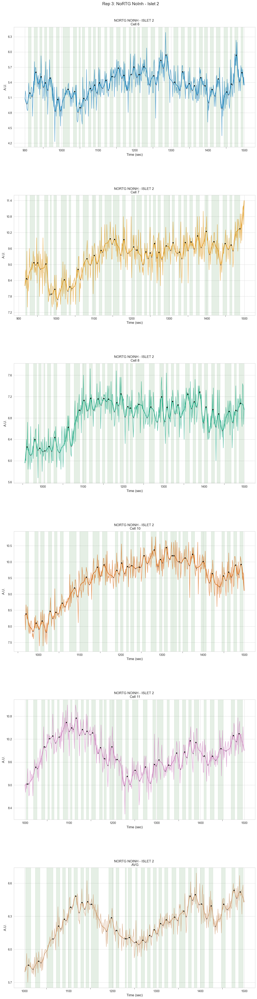

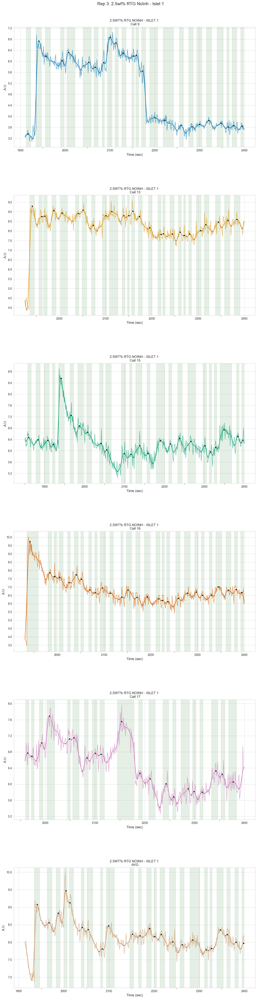

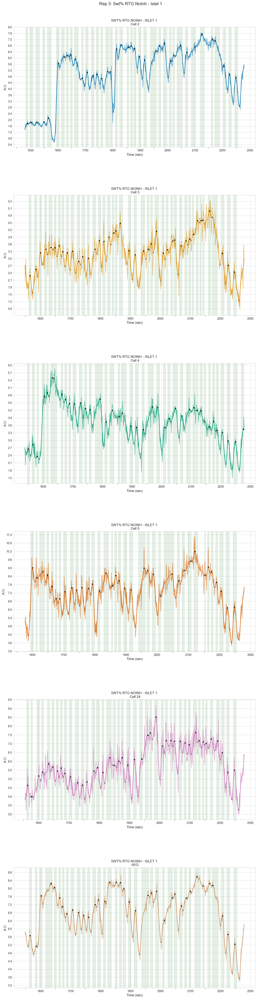

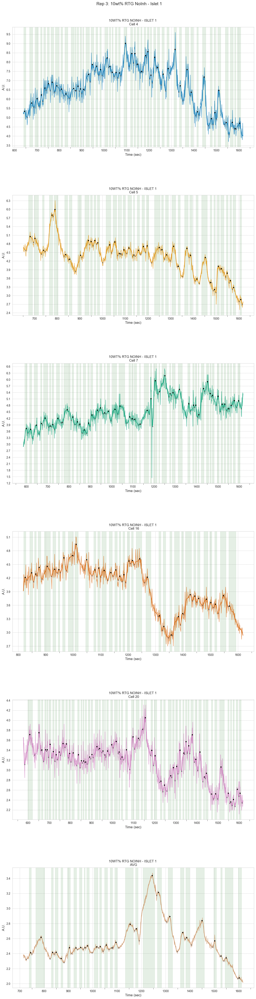

In [23]:
treatments = df.Treatment.unique()
sns.set_style("whitegrid", {'grid.linestyle': '--'})

# loop through the length of tickers and keep track of index
for n, treat in enumerate(treatments):

    temp_df = df[df["Treatment"] == treat]
    temp_md = md[md["Treatment"] == treat]

    cells = temp_df["Cell #"].unique()

    #re-iniitialize the color pallet with each new set of plots:
    palette = sns.color_palette("colorblind", len(cells))

    #initialize plot
    plt.figure(figsize=(15, int(10*len(cells))))
    plt.subplots_adjust(hspace=0.4)
    plt.suptitle(f"Rep {rep}: {treat}", fontsize=15, y=0.9)

    for m, cell in enumerate(cells):



        cell_md = temp_md[temp_md["Example Cells"] == cell]

        wind_start = cell_md["11 mM End"].iloc[0]
        wind_end = cell_md["20 mM Stimulus"].iloc[0]



        plot_df = temp_df[temp_df["Cell #"] == cell]
        plot_df = plot_df[plot_df["Time (sec)"].between(wind_start, wind_end)]

        col_num = 1
        ax = plt.subplot(int(math.ceil(len(cells)/col_num)), col_num, m + 1)
        #ax = plt.gca()
        # filter df and plot ticker on the new subplot axis

        ax.set_xlabel("Time (sec)")
        ax.set_ylabel("A.U.")
        #ax.legend()
        #ax.get_legend().remove()
        #ax.set_xlabel("")

        #sns.lineplot(data = plot_df,x = "Time (sec)", y = "Normalized A.U.", color=palette[m], alpha = 0.75)
        # Set more frequent ticks on the x-axis
        au_change = plot_df["Normalized A.U."].max() - plot_df["Normalized A.U."].min()
        time_change = plot_df["Time (sec)"].max() - plot_df["Time (sec)"].min()


        window = 4
        loops = 3


        #smooth_vals = smooth(plot_df["Normalized A.U."], window, loops)
        #plot_df.insert(2, "Smoothed Normalized A.U.", smooth_vals ,True)
        #sns.lineplot(data = plot_df,x = "Time (sec)", y = "Smoothed Normalized A.U.", color=palette[m])

        """        fs = 100
        sos = scipy.signal.iirfilter(1, Wn=[10, 15], fs=fs, btype="bandpass",
                             ftype="butter", output="sos")
        yfilt = scipy.signal.sosfilt(sos, plot_df["Normalized A.U."])
        plot_df["Smoothed Normalized A.U."] =  yfilt + 5
        peaks, props = scipy.signal.find_peaks(yfilt, distance=0.35*fs, height=0.0)"""

        mode = "medium"
        #sns.lineplot(data = plot_df,x = "Time (sec)", y = "Smoothed Normalized A.U.", color=palette[m])

        if mode == "detailed":
            # Designing a Butterworth IIR filter for smoothing
            order = 3  # Filter order
            #note: adjust cutoff_freq to adjust smoothing
            cutoff_freq = 0.3  # Cutoff frequency, needs to be fine-tuned based on the data
            # Using a Butterworth low-pass filter

        if mode == "medium":
            # Designing a Butterworth IIR filter for smoothing
            order = 3  # Filter order
            #note: adjust cutoff_freq to adjust smoothing
            cutoff_freq = 0.2  # Cutoff frequency, needs to be fine-tuned based on the data
            # Using a Butterworth low-pass filter

        if mode == "smooth":
            #smoothest reasonable settings:
            order = 4  # Filter order
            cutoff_freq = 0.06
        if len(plot_df["Normalized A.U."]) < 12:
            print(cell, treat)
            print(plot_df["Normalized A.U."])
            continue

        b, a = scipy.signal.iirfilter(N=order, Wn=cutoff_freq, btype='low', ftype='butter')
        # Applying the filter to the Cell 1 data
        smoothed_AU = scipy.signal.filtfilt(b, a, plot_df["Normalized A.U."])
        plot_df.insert(2, "Smoothed Normalized A.U.", smoothed_AU ,True)

        yspacing = round_sig((plot_df["Normalized A.U."].max()/20))


        #sns.lineplot(data = plot_df,x = "Time (sec)", y = "Smoothed Normalized A.U.", color=palette[m])

        """      cwt_peaks = scipy.signal.find_peaks_cwt(plot_df["Normalized A.U."], widths=np.arange(3, 30))
        print(cwt_peaks)
        peaks = []

        for peak in cwt_peaks:
            peaks.append(plot_df["Time (sec)"].iloc[peak])

            ax.plot(plot_df["Time (sec)"].iloc[peak], plot_df["Normalized A.U."].iloc[peak], marker=".", color="black", markersize=5)"""

        peaks, troughs, ons = find_troffs_and_peak_ranges(plot_df["Time (sec)"], plot_df["Smoothed Normalized A.U."])


        on_time = 0
        for spread in ons:
            start = plot_df["Time (sec)"].iloc[spread[0]]
            end = plot_df["Time (sec)"].iloc[spread[1]]
            ax.axvspan(start, end, alpha=0.1, color='darkgreen')
            on_time += end - start

        time_span =(max(plot_df["Time (sec)"]) - min(plot_df["Time (sec)"]))
        ratio = on_time/ time_span
        avg_on_time = on_time / len(ons)

        examp.at[cell_md.index[0], "Duty Ratio"] = ratio
        examp.at[cell_md.index[0], "Avg On (sec)"] = avg_on_time

        print(f"ratio of {treat} {cell} ",  ratio)

        """"
        for i, start in enumerate(peak_starts):

            start = plot_df["Time (sec)"].iloc[start]
            print("start " , start)

            if len(peak_ends) >= i:
                end = peak_ends[i]
                end = plot_df["Time (sec)"].iloc[end]
            else:
                end = plot_df["Time (sec)"].max()
                #print("end " , end)

            ax.axvspan(start, end, alpha=0.5, color='green')
        """


        sns.lineplot(data = plot_df,x = "Time (sec)", y = "Normalized A.U.", color=palette[m], alpha = 0.6)
        sns.lineplot(data = plot_df,x = "Time (sec)", y = "Smoothed Normalized A.U.", color=palette[m], alpha = 1)

        for peak in peaks:
            ax.plot(plot_df["Time (sec)"].iloc[peak], plot_df["Smoothed Normalized A.U."].iloc[peak], marker="o", color="black", markersize=3)
        for trough in troughs:
            ax.plot(plot_df["Time (sec)"].iloc[trough], plot_df["Smoothed Normalized A.U."].iloc[trough], marker="o", color="darkgrey", markersize=3,
                    markeredgewidth=0.4, markeredgecolor="black")


        ax.xaxis.set_major_locator(ticker.MultipleLocator(100))  # Adjust the locator value as needed


        ax.yaxis.set_major_locator(ticker.MultipleLocator(yspacing))
        ax.tick_params(axis='x', labelsize=10)  # Adjust the font size of x-axis tick labels
        ax.tick_params(axis='y', labelsize=10)  # Adjust the font size of x-axis tick labels

        # Enable and enlarge minor ticks for visibility
        ax.minorticks_on()
        # Add minor ticks on the x-axis
        ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))  # Adds 1 minor tick between major ticks
        ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=5)

        ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))  # Adds 1 minor tick between major ticks
        #ax.tick_params(axis='y', which='minor', bottom=True, top=False, length=5)


        ax.set_xlabel("Time (sec)", fontsize=12)
        ax.set_ylabel("A.U.", fontsize=12)
        # chart formatting
        ax.set_title(f"{treat.upper()} \n {cell}")



    plt.savefig(f"{folder}/on_off_periods_phase2/Rep{rep}_{treat}_graphs.png", bbox_inches = "tight");






In [24]:
examp

,Unnamed: 0,Treatment,11 mM Stimulus,End 11 mM 2nd Phase,20 mM Stimulus,KCL Stimulus,Example Cells,11 mM End,End Option 1,End Option 2,End Option 3,Represent,Quality,Notes,Duty Ratio,Avg On (sec)
28,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 6,900.000,883.190,1032.115,1411.550,True,1,custom,0.511879,8.525417
29,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 7,916.860,916.860,1019.165,1243.200,True,1,custom,0.508889,9.267344
30,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 8,955.710,481.740,955.710,1275.575,True,2,small pre-peak,0.507143,8.619844
32,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 10,967.365,967.365,1462.055,NaN,True,1,NaN,0.493917,8.762833
33,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 11,999.740,464.905,999.740,1256.150,True,2,small pre-peak,0.481865,7.770000
40,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,AVG,1000.000,488.215,1021.755,1253.560,True,2,"custom, small pre-peak",0.483117,8.305862
49,2,2.5wt% RTG NoInh - Islet 1,1440,NaN,2400,2940,Cell 9,1910.000,1884.225,2048.690,2249.415,True,1,custom,0.531746,10.845625
53,2,2.5wt% RTG NoInh - Islet 1,1440,NaN,2400,2940,Cell 13,1925.000,1912.715,2074.590,2249.415,True,1,custom,0.486339,8.865769
55,2,2.5wt% RTG NoInh - Islet 1,1440,NaN,2400,2940,Cell 15,1850.000,1723.645,2086.245,2293.445,True,1,custom,0.504717,11.547083
56,2,2.5wt% RTG NoInh - Islet 1,1440,NaN,2400,2940,Cell 16,1930.000,1898.470,2222.220,NaN,True,1,NaN,0.505525,8.777222


In [25]:
graph_df = examp.copy()
graph_df["Treatment"] = graph_df["Treatment"].str.split("-", expand=True)[0]
graph_df

,Unnamed: 0,Treatment,11 mM Stimulus,End 11 mM 2nd Phase,20 mM Stimulus,KCL Stimulus,Example Cells,11 mM End,End Option 1,End Option 2,End Option 3,Represent,Quality,Notes,Duty Ratio,Avg On (sec)
28,1,NoRTG NoInh,300,NaN,1500,2640,Cell 6,900.000,883.190,1032.115,1411.550,True,1,custom,0.511879,8.525417
29,1,NoRTG NoInh,300,NaN,1500,2640,Cell 7,916.860,916.860,1019.165,1243.200,True,1,custom,0.508889,9.267344
30,1,NoRTG NoInh,300,NaN,1500,2640,Cell 8,955.710,481.740,955.710,1275.575,True,2,small pre-peak,0.507143,8.619844
32,1,NoRTG NoInh,300,NaN,1500,2640,Cell 10,967.365,967.365,1462.055,NaN,True,1,NaN,0.493917,8.762833
33,1,NoRTG NoInh,300,NaN,1500,2640,Cell 11,999.740,464.905,999.740,1256.150,True,2,small pre-peak,0.481865,7.770000
40,1,NoRTG NoInh,300,NaN,1500,2640,AVG,1000.000,488.215,1021.755,1253.560,True,2,"custom, small pre-peak",0.483117,8.305862
49,2,2.5wt% RTG NoInh,1440,NaN,2400,2940,Cell 9,1910.000,1884.225,2048.690,2249.415,True,1,custom,0.531746,10.845625
53,2,2.5wt% RTG NoInh,1440,NaN,2400,2940,Cell 13,1925.000,1912.715,2074.590,2249.415,True,1,custom,0.486339,8.865769
55,2,2.5wt% RTG NoInh,1440,NaN,2400,2940,Cell 15,1850.000,1723.645,2086.245,2293.445,True,1,custom,0.504717,11.547083
56,2,2.5wt% RTG NoInh,1440,NaN,2400,2940,Cell 16,1930.000,1898.470,2222.220,NaN,True,1,NaN,0.505525,8.777222


In [26]:
if not os.path.exists(f'{folder}/graphs'): 
      
     # if the demo_folder directory is not present then create it
                        
    os.makedirs(f'{folder}/graphs')

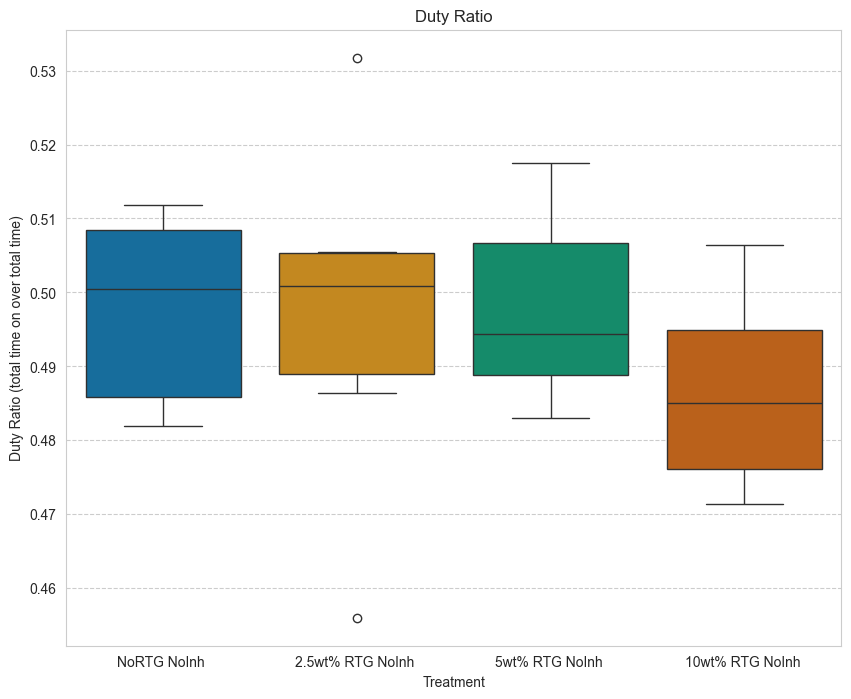

In [27]:
colors = sns.color_palette('colorblind', n_colors=len(graph_df["Treatment"].unique()))

plt.figure(figsize=(10, 8))
#sns.barplot(graph_df, x="Treatment", y="Duty Ratio", hue="Treatment", palette = colors)
sns.boxplot(graph_df, x="Treatment", y="Duty Ratio", hue="Treatment", palette = colors)
#sns.swarmplot(graph_df, x="Treatment", y="Duty Ratio", hue="Treatment", palette = colors)

plt.title("Duty Ratio", fontsize = 12)
plt.ylabel("Duty Ratio (total time on over total time)");

Text(0, 0.5, 'Average On Time (sec)')

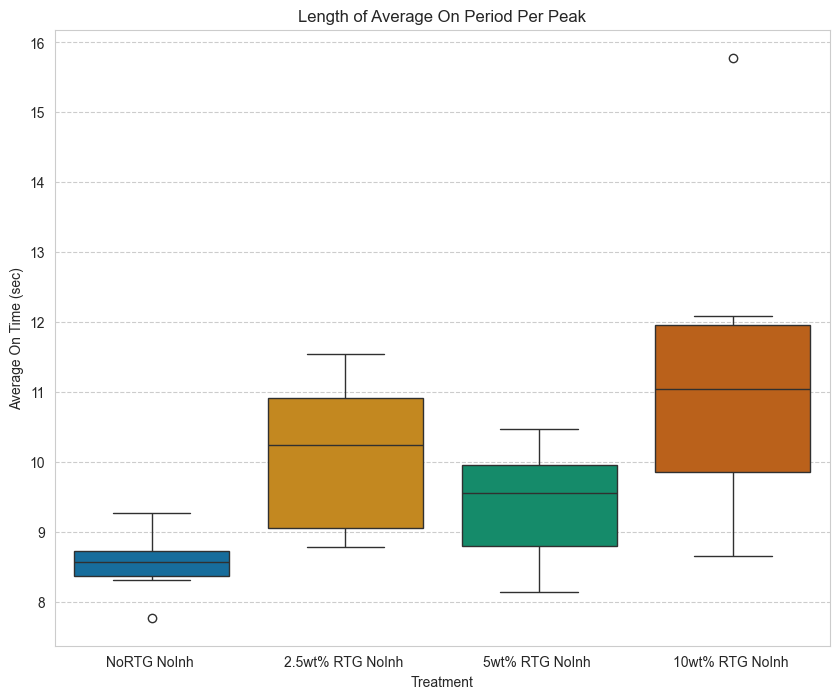

In [28]:
colors = sns.color_palette('colorblind', n_colors=len(graph_df["Treatment"].unique()))

plt.figure(figsize=(10, 8))
#sns.barplot(graph_df, x="Treatment", y="Avg On (sec)", hue="Treatment", palette = colors)
sns.boxplot(graph_df, x="Treatment", y="Avg On (sec)", hue="Treatment", palette = colors)

plt.title("Length of Average On Period Per Peak", fontsize = 12)
plt.ylabel("Average On Time (sec)")


In [29]:
def AUC(md_df, data, start = "11 mM Stimulus", end = "11 mM End", style="Trap", normal = False):
    # Initialize a list to store AUC values for each row in md_df but only works rn with only one typle of cell in each catagory
    AUCs = []

    # Iterate over each row in md_df
    for i, row in md_df.iterrows():
        # Filter 'data' dataframe to include only rows where 'Treatment' matches the current row in md_df
        min_df = data[(data["Treatment"] == row["Treatment"]) & (data["Cell #"] == row["Example Cells"])]
        # Further filter 'min_df' to include only rows where 'Time (sec)' is between 'Start' and 'End' of the current row in md_df
        min_df = min_df[min_df["Time (sec)"].between(row[start], row[end])]
                # Check if min_df is empty

        if min_df.empty:

            AUCs.append(np.nan)  # Append NaN or some other placeholder
            continue
        # Extract 'Time (sec)' column as x-values
        x = min_df["Time (sec)"].values

        if normal == False:
            # Calculate y-values by subtracting the baseline (first value) from 'Normalized A.U.'
            y = min_df['Normalized A.U.'] - min_df['Normalized A.U.'].iloc[0]
            print(y)
        if normal == True:
            y = min_df['Normalized A.U.']/min_df['Normalized A.U.'].iloc[0]




        # Choose the method to calculate AUC based on the 'type' parameter
        if style.lower() == "trap":
            # Calculate the AUC using the trapezoidal rule
            AUC_value = np.trapz(y, x)
        elif style.lower() == "rect":
            # Calculate the AUC using the rectangular method
            y = y.values
            AUC_value = 0
            for i in range(1, len(y)):
                # Calculate the width of each rectangle (delta_x)
                delta_x = (x[i] - x[i-1])
                # Height of the rectangle (delta_y)
                delta_y = y[i-1]
                # Incrementally add the area of each rectangle to 'AUC_value'
                AUC_value += delta_x * delta_y

        # Append the calculated AUC to the AUCs list
        AUCs.append(AUC_value)

    if style == "rect":
        md_df["AUC (rect)"] = AUCs
        return md_df

    # Add a new column 'AUC' to md_df containing the calculated AUCs
    md_df["AUC (trap)"] = AUCs
    # Return the modified md_df with AUC values
    return md_df


In [30]:
examp = AUC(examp.copy(), df.copy(), style="rect", normal = False)
examp = AUC(examp.copy(), df.copy(), style="trap")


66006    0.000000
66007    0.038422
66008    0.076843
66009    0.230876
66010    0.307719
           ...   
66464    4.461405
66465    4.384562
66466    4.615092
66467    4.769124
66468    4.422984
Name: Normalized A.U., Length: 463, dtype: float64
68167    0.0
68168    0.2
68169    0.2
68170    0.1
68171    0.1
        ... 
68639    7.2
68640    7.0
68641    6.9
68642    7.2
68643    7.1
Name: Normalized A.U., Length: 477, dtype: float64
70328    0.00
70329    0.04
70330    0.04
70331   -0.08
70332    0.12
         ... 
70830    4.60
70831    5.44
70832    4.68
70833    4.84
70834    4.96
Name: Normalized A.U., Length: 507, dtype: float64
74650    0.000000
74651    0.055667
74652    0.166667
74653    0.389000
74654    0.166667
           ...   
75161    8.111333
75162    8.389000
75163    7.778000
75164    7.222333
75165    7.555667
Name: Normalized A.U., Length: 516, dtype: float64
76811    0.000000
76812   -0.238000
76813    0.047714
76814   -0.142857
76815   -0.238000
           ..

In [31]:
examp

,Unnamed: 0,Treatment,11 mM Stimulus,End 11 mM 2nd Phase,20 mM Stimulus,KCL Stimulus,Example Cells,11 mM End,End Option 1,End Option 2,End Option 3,Represent,Quality,Notes,Duty Ratio,Avg On (sec),AUC (rect),AUC (trap)
28,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 6,900.000,883.190,1032.115,1411.550,True,1,custom,0.511879,8.525417,3592.021154,3594.885036
29,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 7,916.860,916.860,1019.165,1243.200,True,1,custom,0.508889,9.267344,6511.389500,6515.986750
30,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 8,955.710,481.740,955.710,1275.575,True,2,small pre-peak,0.507143,8.619844,4783.989000,4787.200600
32,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 10,967.365,967.365,1462.055,NaN,True,1,NaN,0.493917,8.762833,6111.392922,6116.285216
33,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,Cell 11,999.740,464.905,999.740,1256.150,True,2,small pre-peak,0.481865,7.770000,7504.837650,7509.586045
40,1,NoRTG NoInh - Islet 2,300,NaN,1500,2640,AVG,1000.000,488.215,1021.755,1253.560,True,2,"custom, small pre-peak",0.483117,8.305862,4712.645763,4715.865426
49,2,2.5wt% RTG NoInh - Islet 1,1440,NaN,2400,2940,Cell 9,1910.000,1884.225,2048.690,2249.415,True,1,custom,0.531746,10.845625,1939.566016,1941.033008
53,2,2.5wt% RTG NoInh - Islet 1,1440,NaN,2400,2940,Cell 13,1925.000,1912.715,2074.590,2249.415,True,1,custom,0.486339,8.865769,4214.331897,4215.805517
55,2,2.5wt% RTG NoInh - Islet 1,1440,NaN,2400,2940,Cell 15,1850.000,1723.645,2086.245,2293.445,True,1,custom,0.504717,11.547083,2151.160643,2154.384935
56,2,2.5wt% RTG NoInh - Islet 1,1440,NaN,2400,2940,Cell 16,1930.000,1898.470,2222.220,NaN,True,1,NaN,0.505525,8.777222,2813.675278,2815.401944


In [32]:
report_df = examp[["Treatment", "Duty Ratio", "Avg On (sec)", "Example Cells", "AUC (rect)", "AUC (trap)"]]
report_df


,Treatment,Duty Ratio,Avg On (sec),Example Cells,AUC (rect),AUC (trap)
28,NoRTG NoInh - Islet 2,0.511879,8.525417,Cell 6,3592.021154,3594.885036
29,NoRTG NoInh - Islet 2,0.508889,9.267344,Cell 7,6511.389500,6515.986750
30,NoRTG NoInh - Islet 2,0.507143,8.619844,Cell 8,4783.989000,4787.200600
32,NoRTG NoInh - Islet 2,0.493917,8.762833,Cell 10,6111.392922,6116.285216
33,NoRTG NoInh - Islet 2,0.481865,7.770000,Cell 11,7504.837650,7509.586045
40,NoRTG NoInh - Islet 2,0.483117,8.305862,AVG,4712.645763,4715.865426
49,2.5wt% RTG NoInh - Islet 1,0.531746,10.845625,Cell 9,1939.566016,1941.033008
53,2.5wt% RTG NoInh - Islet 1,0.486339,8.865769,Cell 13,4214.331897,4215.805517
55,2.5wt% RTG NoInh - Islet 1,0.504717,11.547083,Cell 15,2151.160643,2154.384935
56,2.5wt% RTG NoInh - Islet 1,0.505525,8.777222,Cell 16,2813.675278,2815.401944


In [33]:

report_df.to_excel(f"{folder}/Rep1_DutyRatio_and_AUC.xlsx")

In [34]:
print(f"{folder}/Rep1_DutyRatio_and_AUC.xlsx")

./rep3_data_analysis/Rep1_DutyRatio_and_AUC.xlsx


In [35]:
def normalize_AUC(column):

    return column

In [36]:
treatments

array(['NoRTG NoInh - Islet 2', '2.5wt% RTG NoInh - Islet 1',
       '5wt% RTG NoInh - Islet 1', '10wt% RTG NoInh - Islet 1'],
      dtype=object)

In [37]:
md_plot = report_df.copy()

md_plot[["Treatment" , "Islet"]] = md_plot["Treatment"].str.split(" - ", n = 1, expand = True)

md_plot

,Treatment,Duty Ratio,Avg On (sec),Example Cells,AUC (rect),AUC (trap),Islet
28,NoRTG NoInh,0.511879,8.525417,Cell 6,3592.021154,3594.885036,Islet 2
29,NoRTG NoInh,0.508889,9.267344,Cell 7,6511.389500,6515.986750,Islet 2
30,NoRTG NoInh,0.507143,8.619844,Cell 8,4783.989000,4787.200600,Islet 2
32,NoRTG NoInh,0.493917,8.762833,Cell 10,6111.392922,6116.285216,Islet 2
33,NoRTG NoInh,0.481865,7.770000,Cell 11,7504.837650,7509.586045,Islet 2
40,NoRTG NoInh,0.483117,8.305862,AVG,4712.645763,4715.865426,Islet 2
49,2.5wt% RTG NoInh,0.531746,10.845625,Cell 9,1939.566016,1941.033008,Islet 1
53,2.5wt% RTG NoInh,0.486339,8.865769,Cell 13,4214.331897,4215.805517,Islet 1
55,2.5wt% RTG NoInh,0.504717,11.547083,Cell 15,2151.160643,2154.384935,Islet 1
56,2.5wt% RTG NoInh,0.505525,8.777222,Cell 16,2813.675278,2815.401944,Islet 1


In [38]:
order_key=['NoRTG NoInh', '2.5wt% RTG NoInh', '5wt% RTG NoInh', '10wt% RTG NoInh']
order =[]

for i in order_key:
    if i in list(md_plot["Treatment"]):
        order.append(i)
order

['NoRTG NoInh', '2.5wt% RTG NoInh', '5wt% RTG NoInh', '10wt% RTG NoInh']

/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_19884/368630602.py:3: UserWarning: The palette list has more values (25) than needed (4), which may not be intended.
  ax = sns.barplot(md_plot, x="Treatment", y="AUC (rect)", hue="Treatment", palette = colors, estimator = "mean", order=order)


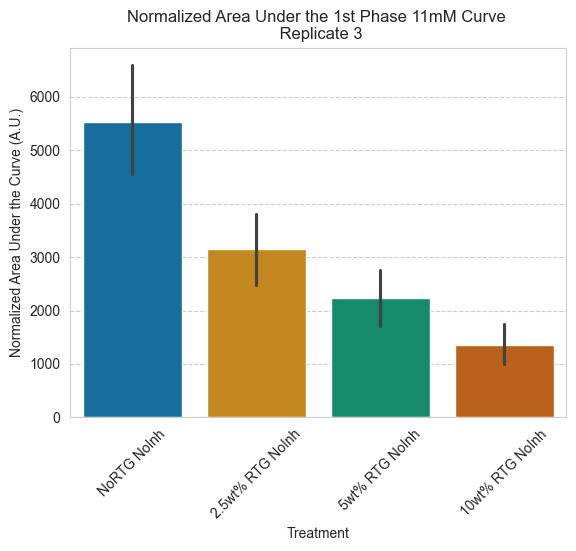

In [39]:
colors = sns.color_palette('colorblind', n_colors=len(treat))

ax = sns.barplot(md_plot, x="Treatment", y="AUC (rect)", hue="Treatment", palette = colors, estimator = "mean", order=order)


ax.set_ylabel('Normalized Area Under the Curve (A.U.)')

ax.set_title(f"Normalized Area Under the 1st Phase 11mM Curve \n Replicate {rep}")

plt.xticks(rotation=45)


plt.savefig(f'{folder}/graphs/Rep{rep}_11mM_curve_AUC_barplot.png', bbox_inches = "tight");

In [40]:
#md_plot[["Rep", "Islet"]] =  md_plot["Islet"].str.split(" - ", n = 1, expand = True)

/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_19884/3583939778.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.swarmplot(md_plot, x="Treatment", y="AUC (rect)", palette = colors, order=order)
/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_19884/3583939778.py:3: UserWarning: The palette list has more values (25) than needed (4), which may not be intended.
  ax = sns.swarmplot(md_plot, x="Treatment", y="AUC (rect)", palette = colors, order=order)


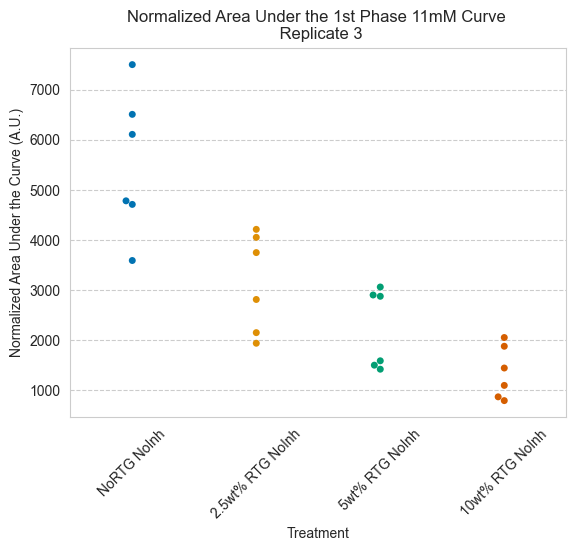

In [41]:
colors = sns.color_palette('colorblind', n_colors=len(treat))

ax = sns.swarmplot(md_plot, x="Treatment", y="AUC (rect)", palette = colors, order=order)


ax.set_ylabel('Normalized Area Under the Curve (A.U.)')

ax.set_title(f"Normalized Area Under the 1st Phase 11mM Curve \n Replicate {rep}")

plt.xticks(rotation=45)

plt.savefig(f'{folder}/graphs/Rep{rep}_11mM_curve_AUC_swarmplot.png', bbox_inches = "tight");
#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1), labels = ['Rep 1','Rep 2','Rep 3']);

In [42]:
md_plot = md_plot.loc[:,~md_plot.apply(lambda x: x.duplicated(),axis=1).all()].copy()

In [43]:
md_plot

,Treatment,Duty Ratio,Avg On (sec),Example Cells,AUC (rect),AUC (trap),Islet
28,NoRTG NoInh,0.511879,8.525417,Cell 6,3592.021154,3594.885036,Islet 2
29,NoRTG NoInh,0.508889,9.267344,Cell 7,6511.389500,6515.986750,Islet 2
30,NoRTG NoInh,0.507143,8.619844,Cell 8,4783.989000,4787.200600,Islet 2
32,NoRTG NoInh,0.493917,8.762833,Cell 10,6111.392922,6116.285216,Islet 2
33,NoRTG NoInh,0.481865,7.770000,Cell 11,7504.837650,7509.586045,Islet 2
40,NoRTG NoInh,0.483117,8.305862,AVG,4712.645763,4715.865426,Islet 2
49,2.5wt% RTG NoInh,0.531746,10.845625,Cell 9,1939.566016,1941.033008,Islet 1
53,2.5wt% RTG NoInh,0.486339,8.865769,Cell 13,4214.331897,4215.805517,Islet 1
55,2.5wt% RTG NoInh,0.504717,11.547083,Cell 15,2151.160643,2154.384935,Islet 1
56,2.5wt% RTG NoInh,0.505525,8.777222,Cell 16,2813.675278,2815.401944,Islet 1


/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_19884/2848180492.py:3: UserWarning: The palette list has more values (25) than needed (2), which may not be intended.
  ax = sns.swarmplot(md_plot, x="Treatment", y="Duty Ratio", hue="Islet", palette = colors, order=order)


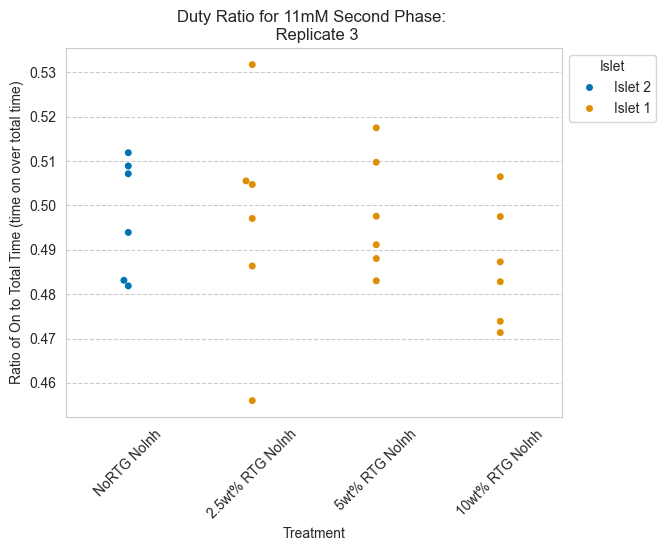

In [44]:
colors = sns.color_palette('colorblind', n_colors=len(treat))

ax = sns.swarmplot(md_plot, x="Treatment", y="Duty Ratio", hue="Islet", palette = colors, order=order)

ax.set_ylabel('Ratio of On to Total Time (time on over total time)')

ax.set_title(f"Duty Ratio for 11mM Second Phase: \n Replicate {rep}")

plt.xticks(rotation=45)

plt.savefig(f"{folder}/Rep{rep}_Duty Ratio.png", bbox_inches = "tight")
plt.savefig(f'{folder}/graphs/Rep{rep}_11mM_curve_duty_ratio_swarmplot.png', bbox_inches = "tight");
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1));

/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_19884/798943453.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(md_plot, x="Treatment", y="Duty Ratio", palette = colors, order=order)
/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_19884/798943453.py:3: UserWarning: The palette list has more values (25) than needed (4), which may not be intended.
  ax = sns.barplot(md_plot, x="Treatment", y="Duty Ratio", palette = colors, order=order)


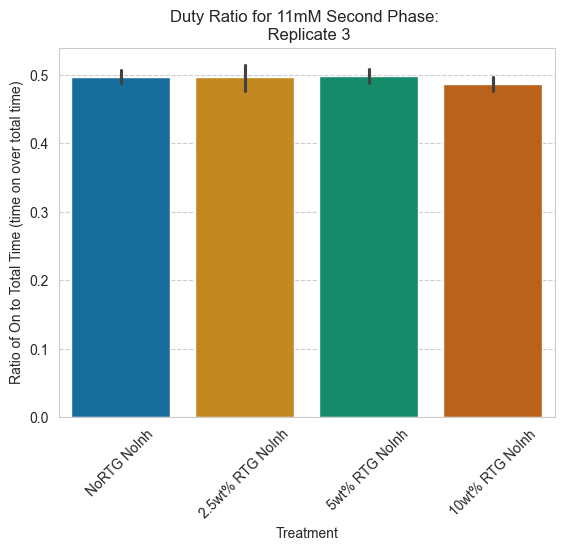

In [45]:
colors = sns.color_palette('colorblind', n_colors=len(treat))

ax = sns.barplot(md_plot, x="Treatment", y="Duty Ratio", palette = colors, order=order)


ax.set_ylabel('Ratio of On to Total Time (time on over total time)')

ax.set_title(f"Duty Ratio for 11mM Second Phase: \n Replicate {rep}")

plt.xticks(rotation=45)

plt.savefig(f'{folder}/graphs/Rep{rep}_11mM_curve_duty_ratio_barplot.png', bbox_inches = "tight");
